In [226]:
import glob
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt

from math import sqrt, degrees, atan, atan2
from dotmap import DotMap


In [227]:
def read_one_image(filename):
    img = cv2.imread(filename)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return (img, filename.split("./data/")[1])


def read_images(filename=None):
    filename = "./data/{}".format(filename) if filename is not None else "./data/*.*"
    return [read_one_image(file) for file in glob.glob(filename)]


images = read_images()

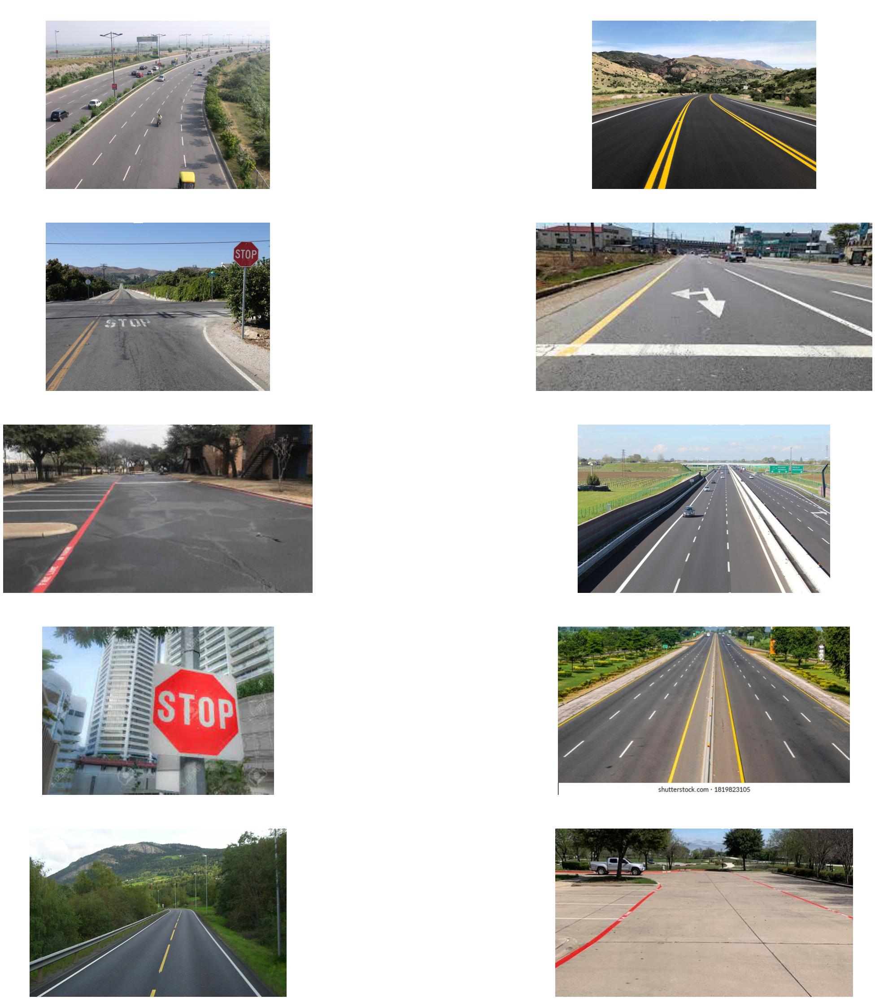

In [228]:

def show_images(images, title="", cmap=None):
    subplot_rows = (len(images) + 1) // 2 if len(images) > 1 else 1
    subplot_cols = 2 if len(images) > 1 else 1
    plt.subplots(subplot_rows, subplot_cols, figsize=(40, 40))
    for i, (img, filename) in enumerate(images):
        plt.subplot(subplot_rows, subplot_cols, i + 1)
        plt.axis("off")
        plt.title("{} {}".format(filename, title), fontsize=40, color='white')
        if cmap:
            plt.imshow(img, cmap)
        else:
            plt.imshow(img)


show_images(images)

In [229]:
def apply(images, fun, show=False, cmap=None, *args, **kwargs):
    new_images = [(fun(img, *args, **kwargs), filename) for (img, filename) in images]
    if show:
        show_images(new_images, cmap)
    return new_images

In [230]:

def gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)


gray_images = apply(images, gray_scale, cmap='gray')

In [342]:

def resize_image(image, dim=(720, 480)):
    return cv2.resize(image, dim, interpolation=cv2.INTER_AREA)


def dilation(image, kernel_size=3, iterations=1):
    return cv2.dilate(image, np.ones((kernel_size, kernel_size), np.uint8), iterations)


def erosion(image, kernel_size, iterations=1):
    return cv2.erode(image, np.ones((kernel_size, kernel_size), np.uint8), iterations)


def opening(image, kernel_size):
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, np.ones((kernel_size, kernel_size), np.uint8))


def closing(image, kernel_size):
    return cv2.morphologyEx(image, cv2.MORPH_CLOSE, np.ones((kernel_size, kernel_size), np.uint8))


def gaussian(image, kernel_size):
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), cv2.BORDER_CONSTANT)


def thresholding(gray_image):
    ret, thresh1 = cv2.threshold(gray_image, 120, 255, cv2.THRESH_BINARY +
                                 cv2.THRESH_OTSU)
    return thresh1


def remove_noise(image):
    return cv2.fastNlMeansDenoisingColored(image, None, 10, 10, 7, 21)

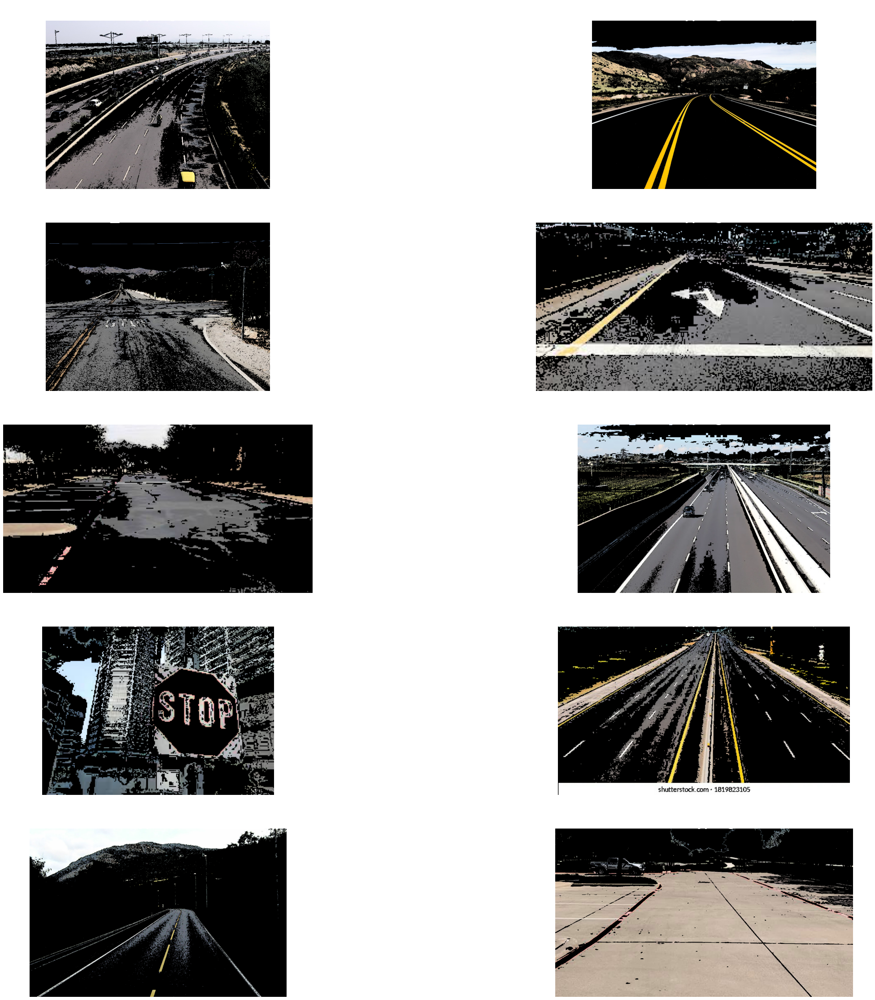

In [232]:
def rgb_color_mask(image):
    """
    Apply color selection to RGB images to blackout everything except for white and yellow lane lines.
        Parameters:
            image: An np.array compatible with plt.imshow.
    """
    #Gray color mask
    lower_threshold = np.uint8([50, 50, 110])
    upper_threshold = np.uint8([140, 140, 140])
    gray_mask = cv2.inRange(image, lower_threshold, upper_threshold)

    #White color mask
    lower_threshold = np.uint8([200, 200, 200])
    upper_threshold = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(image, lower_threshold, upper_threshold)

    #Yellow color mask
    lower_threshold = np.uint8([171, 141, 0])
    upper_threshold = np.uint8([255, 255, 200])
    yellow_mask = cv2.inRange(image, lower_threshold, upper_threshold)

    #Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    #Resultant mask
    mask = cv2.bitwise_or(mask, gray_mask)
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    return masked_image


apply(read_images(), rgb_color_mask, show=True);

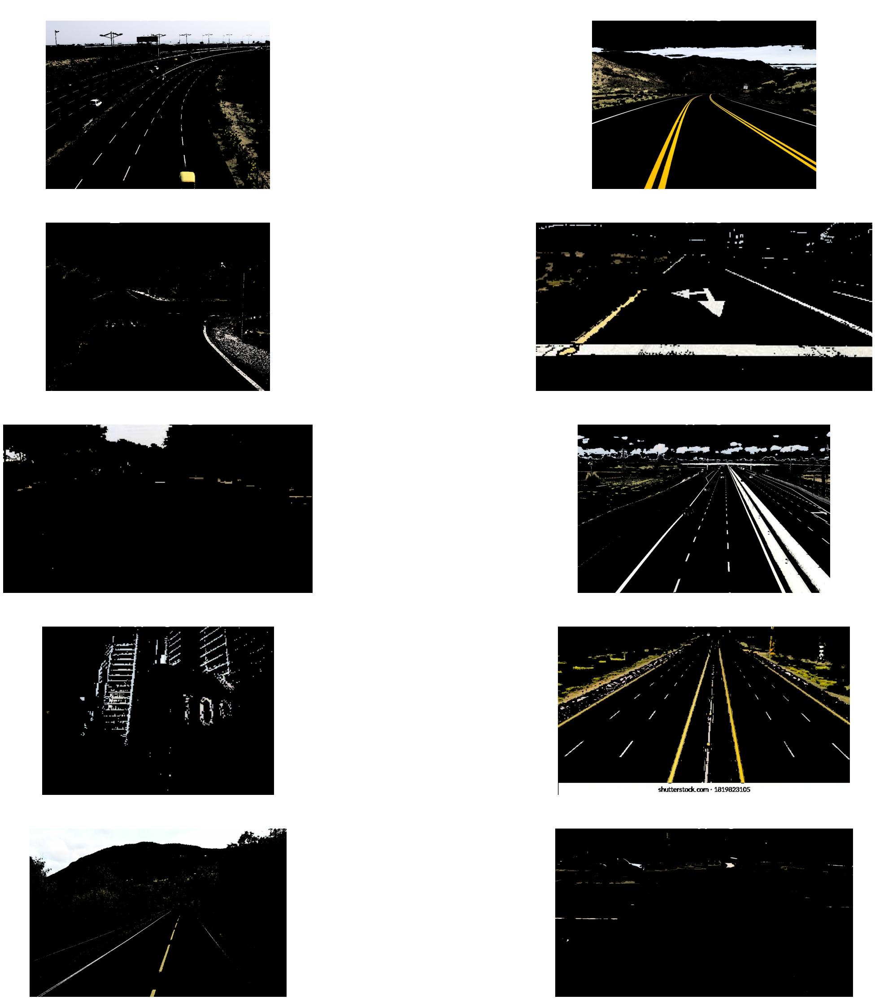

In [233]:
def hsv_color_mask(image):
    """
    Apply color selection to the HSV images to blackout everything except for white and yellow lane lines.
        Parameters:
            image: An np.array compatible with plt.imshow.
    """
    #Convert the input image to HSV
    converted_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    #White color mask
    lower_threshold = np.uint8([0, 0, 210])
    upper_threshold = np.uint8([255, 30, 255])
    white_mask = cv2.inRange(converted_image, lower_threshold, upper_threshold)

    #Yellow color mask
    lower_threshold = np.uint8([18, 80, 80])
    upper_threshold = np.uint8([30, 255, 255])
    yellow_mask = cv2.inRange(converted_image, lower_threshold, upper_threshold)

    #Combine white and yellow masks
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    return masked_image


apply(read_images(), hsv_color_mask, show=True);

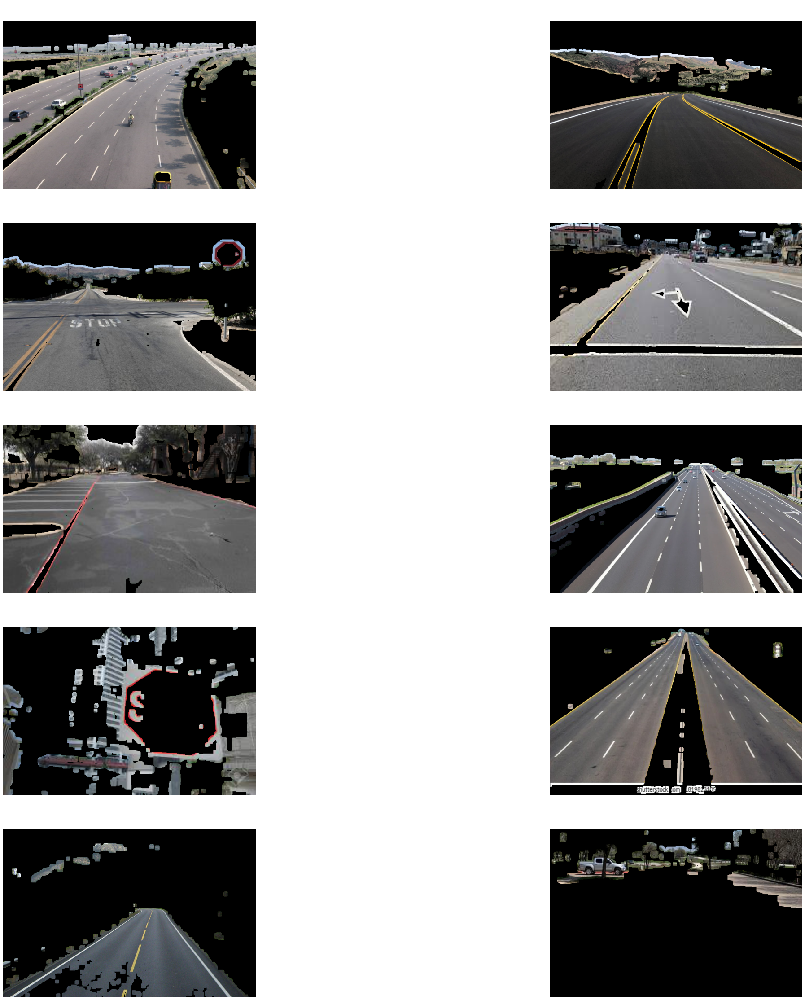

In [449]:
def create_hls_from_hsl(h, s, l):
    return np.uint8([h / 2, 255 * l / 100, 255 * s / 100])

def get_yellow_mask(image):
    #Yellow color mask
    lower_threshold = create_hls_from_hsl(20, 20, 20)
    upper_threshold = create_hls_from_hsl(54, 100, 100)
    yellow_mask = cv2.inRange(image, lower_threshold, upper_threshold)
    return yellow_mask

def get_white_mask(image):
    #White color mask
    lower_threshold = create_hls_from_hsl(0, 0, 75)
    upper_threshold = create_hls_from_hsl(360, 100, 100)
    white_mask = cv2.inRange(image, lower_threshold, upper_threshold)
    return white_mask

def get_red_mask(image):
    #Red color mask
    #Red lower threshold
    lower_threshold = create_hls_from_hsl(0, 50, 20)
    upper_threshold = create_hls_from_hsl(30, 100, 80)
    red_mask1 = cv2.inRange(image, lower_threshold, upper_threshold)
    #Red upper threshold
    lower_threshold = create_hls_from_hsl(320, 50, 20)
    upper_threshold = create_hls_from_hsl(360, 100, 80)
    red_mask2 = cv2.inRange(image, lower_threshold, upper_threshold)
    red_mask = red_mask1 + red_mask2
    return red_mask

def get_wry_mask(image):
    white_mask = get_white_mask(image)
    yellow_mask = get_yellow_mask(image)
    red_mask = get_red_mask(image)
    #Combine white, yellow and red masks
    mask = cv2.bitwise_or(cv2.bitwise_or(white_mask, yellow_mask), red_mask)
    return mask

def extract_gray_mask(image):
    orig_image = np.copy(image)
    #Convert the input image to HSL
    image = gaussian(image, 15)
    converted_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)

    #Gray color mask
    #Gray lower threshold
    lower_threshold = create_hls_from_hsl(0, 0, 10)
    upper_threshold = create_hls_from_hsl(70, 10, 70)
    gray_mask1 = cv2.inRange(converted_image, lower_threshold, upper_threshold)
    #Gray upper threshold
    lower_threshold = create_hls_from_hsl(205, 0, 10)
    upper_threshold = create_hls_from_hsl(360, 10, 70)
    gray_mask2 = cv2.inRange(converted_image, lower_threshold, upper_threshold)
    gray_mask = cv2.bitwise_or(gray_mask1, gray_mask2)
    gray_mask = gaussian(gray_mask, 5)
    gray_mask = draw_contour(gray_mask, 100, 100000, mode=cv2.RETR_EXTERNAL)
    gray_mask = gaussian(gray_mask, 5)
    gray_mask = dilation(gray_mask, 5)

    #wyr_mask = get_wry_mask(orig_image)
    #mask = cv2.bitwise_or(gray_mask, wyr_mask)

    masked_image = cv2.bitwise_and(orig_image, orig_image, mask=gray_mask)
    return masked_image

def extract_white_red_yellow_mask(image):
    #Convert the input image to HSL
    converted_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    mask = get_wry_mask(converted_image)
    masked_image = cv2.bitwise_and(image, image, mask=mask)
    return masked_image


#images = apply(read_images('lane2.jpeg'), resize_image)
images = apply(read_images(), resize_image)
images = apply(images, extract_gray_mask);
show_images(images, cmap='gray')


In [235]:
def get_orientation(line):
    '''get orientation of a line, using its length
    https://en.wikipedia.org/wiki/Atan2
    '''
    orientation = math.atan2(abs((line[0] - line[2])), abs((line[1] - line[3])))
    return math.degrees(orientation)


def checker(line_new, groups, min_distance_to_merge, min_angle_to_merge):
    '''Check if line have enough distance and angle to be count as similar
    '''
    for group in groups:
        # walk through existing line groups
        for line_old in group:
            # check distance
            if get_distance(line_old, line_new) < min_distance_to_merge:
                # check the angle between lines
                orientation_new = get_orientation(line_new)
                orientation_old = get_orientation(line_old)
                # if all is ok -- line is similar to others in group
                if abs(orientation_new - orientation_old) < min_angle_to_merge:
                    group.append(line_new)
                    return False
    # if it is totally different line
    return True


def DistancePointLine(point, line):
    """Get distance between point and line
    http://local.wasp.uwa.edu.au/~pbourke/geometry/pointline/source.vba
    """
    px, py = point
    x1, y1, x2, y2 = line

    def lineMagnitude(x1, y1, x2, y2):
        'Get line (aka vector) length'
        lineMagnitude = math.sqrt(math.pow((x2 - x1), 2) + math.pow((y2 - y1), 2))
        return lineMagnitude

    LineMag = lineMagnitude(x1, y1, x2, y2)
    if LineMag < 0.00000001:
        DistancePointLine = 9999
        return DistancePointLine

    u1 = (((px - x1) * (x2 - x1)) + ((py - y1) * (y2 - y1)))
    u = u1 / (LineMag * LineMag)

    if (u < 0.00001) or (u > 1):
        #// closest point does not fall within the line segment, take the shorter distance
        #// to an endpoint
        ix = lineMagnitude(px, py, x1, y1)
        iy = lineMagnitude(px, py, x2, y2)
        if ix > iy:
            DistancePointLine = iy
        else:
            DistancePointLine = ix
    else:
        # Intersecting point is on the line, use the formula
        ix = x1 + u * (x2 - x1)
        iy = y1 + u * (y2 - y1)
        DistancePointLine = lineMagnitude(px, py, ix, iy)

    return DistancePointLine


def get_distance(a_line, b_line):
    """Get all possible distances between each dot of two lines and second line
    return the shortest
    """
    dist1 = DistancePointLine(a_line[:2], b_line)
    dist2 = DistancePointLine(a_line[2:], b_line)
    dist3 = DistancePointLine(b_line[:2], a_line)
    dist4 = DistancePointLine(b_line[2:], a_line)

    return min(dist1, dist2, dist3, dist4)


def merge_lines_pipeline_2(lines):
    'Clusterize (group) lines'
    groups = []  # all lines groups are here
    # Parameters to play with
    min_distance_to_merge = 15
    min_angle_to_merge = 15
    # first line will create new group every time
    groups.append([lines[0]])
    # if line is different from existing gropus, create a new group
    for line_new in lines[1:]:
        if checker(line_new, groups, min_distance_to_merge, min_angle_to_merge):
            groups.append([line_new])

    return groups


def merge_lines_segments1(lines):
    """Sort lines cluster and return first and last coordinates
    """
    orientation = get_orientation(lines[0])

    # special case
    if (len(lines) == 1):
        return [lines[0][:2], lines[0][2:]]

    # [[1,2,3,4],[]] to [[1,2],[3,4],[],[]]
    points = []
    for line in lines:
        points.append(line[:2])
        points.append(line[2:])
    # if vertical
    if 45 < orientation < 135:
        #sort by y
        points = sorted(points, key=lambda point: point[1])
    else:
        #sort by x
        points = sorted(points, key=lambda point: point[0])

    # return first and last point in sorted group
    # [[x,y],[x,y]]
    return [points[0], points[-1]]


def process_lines(lines):
    '''Main function for lines from cv.HoughLinesP() output merging
    for OpenCV 3
    lines -- cv.HoughLinesP() output
    img -- binary image
    '''
    lines_x = []
    lines_y = []
    # for every line of cv2.HoughLinesP()
    for line_i in [l[0] for l in lines]:
        orientation = get_orientation(line_i)
        # if vertical
        if 45 < orientation < 135:
            lines_y.append(line_i)
        else:
            lines_x.append(line_i)

    lines_y = sorted(lines_y, key=lambda line: line[1])
    lines_x = sorted(lines_x, key=lambda line: line[0])
    merged_lines_all = []

    # for each cluster in vertical and horizantal lines leave only one line
    for i in [lines_x, lines_y]:
        if len(i) > 0:
            groups = merge_lines_pipeline_2(i)
            merged_lines = []
            for group in groups:
                merged_lines.append(merge_lines_segments1(group))

            merged_lines_all.extend(merged_lines)

    final_lines = []
    for line in merged_lines_all:
        x1 = line[0][0]
        y1 = line[0][1]
        x2 = line[1][0]
        y2 = line[1][1]
        final_lines.append([[x1, y1, x2, y2]])

    return final_lines

totals: expected: 43, actual:151, diff:-108, mse:272.4


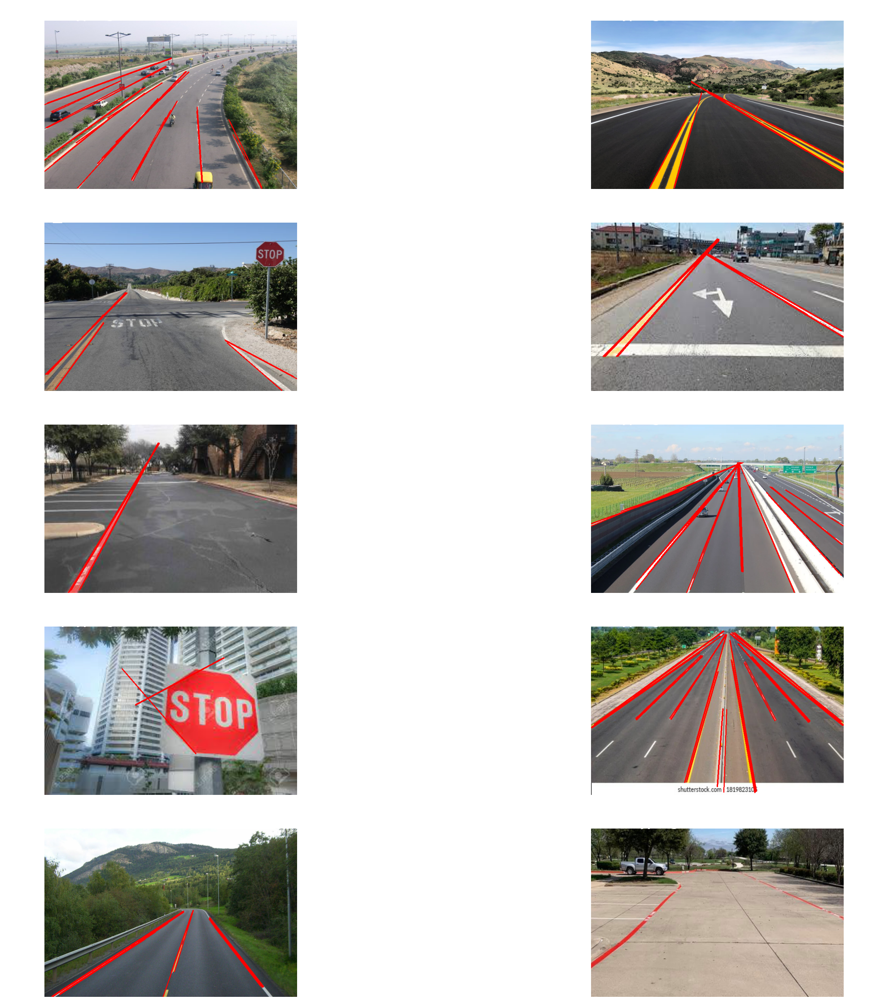

In [487]:
config = DotMap()
config.LOWER_SLOPE_TH = 0.2
config.EROSION_KERNEL_SIZE = 2
config.DILATION_KERNEL_SIZE = 2
config.ITERATIONS = 1
config.MIN_CONTOUR_AREA = 100
config.GAUSSIAN_KERNEL_SIZE = 5
config.OPENING_KERNEL_SIZE = 2


def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    return cv2.addWeighted(initial_img, α, img, β, λ)


def draw_lane_lines(image, lines, color=[255, 0, 0], thickness=2, only_lines=True):
    if only_lines:
        image = np.zeros(image.shape)

    for line in lines:
        if line is not None:
            (x1, y1, x2, y2) = line
            cv2.line(image, (x1, y1), (x2, y2), color, thickness)

    return image
    #return cv2.addWeighted(image, 1.0, line_image, 1.0, 0.0)


def get_slope(x1, y1, x2, y2):
    if x2 == x1:
        return float('inf')
    return (y2 - y1) / (x2 - x1)


def get_intercept(slope, x1, y1):
    return y1 - (slope * x1)


def region_selection(image):
    mask = np.zeros_like(image)
    #Defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(image.shape) > 2:
        channel_count = image.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    #We could have used fixed numbers as the vertices of the polygon,
    #but they will not be applicable to images with different dimesnions.
    rows, cols = image.shape[:2]
    bottom_left = [cols * 0, rows * 1]
    top_left = [cols * 0, rows * 0.40]
    bottom_right = [cols * 1, rows * 1]
    top_right = [cols * 1, rows * 0.40]
    vertices = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image = cv2.bitwise_and(image, mask)
    return masked_image


def get_skeleton(image):
    # Step 1: Create an empty skeleton
    size = np.size(image)
    skel = np.zeros(image.shape, np.uint8)

    # Get a Cross Shaped Kernel
    kernel_size = 2
    element = cv2.getStructuringElement(cv2.MORPH_CROSS, (kernel_size, kernel_size))

    # Repeat steps 2-4
    for i in range(1):
        #Step 2: Open the image
        open = cv2.morphologyEx(image, cv2.MORPH_OPEN, element)
        #Step 3: Substract open from the original image
        temp = cv2.subtract(image, open)
        #Step 4: Erode the original image and refine the skeleton
        eroded = cv2.erode(image, element)
        skel = cv2.bitwise_or(skel, temp)
        image = eroded.copy()

    return image


def hough_transform(image, masked_image, only_lines, merge_lines):
    rho = 1  #Distance resolution of the accumulator in pixels.
    theta = np.pi / 180  #Angle resolution of the accumulator in radians.
    threshold = 100  #Only lines that are greater than threshold will be returned.
    minLineLength = 150  #Line segments shorter than that are rejected.
    maxLineGap = 50  #Maximum allowed gap between points on the same line to link them
    hough_lines = cv2.HoughLinesP(masked_image, rho=rho, theta=theta, threshold=threshold,
                                  minLineLength=minLineLength, maxLineGap=maxLineGap)

    if hough_lines is None:
        return image, 0

    if merge_lines:
        hough_lines = process_lines(hough_lines)

    hough_lines = np.squeeze(hough_lines, axis=1)

    slopes = []
    intercepts = []
    merged_lines = []

    for line in hough_lines:
        x1, y1, x2, y2 = line
        slope = get_slope(x1, y1, x2, y2)
        intercept = get_intercept(slope, x1, y1)
        line_length = sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
        angle = abs(degrees(atan(slope)))
        if all((18 <= angle <= 89, line_length > 100)):
            merged_lines.append((x1, y1, x2, y2))
            slopes.append(slope)
            intercepts.append(intercept)

    #return draw_lane_lines(image, merged_lines, only_lines), len(merged_lines)

    if only_lines:
        image = np.zeros(image.shape)

    for line in merged_lines:
        (x1, y1, x2, y2) = line
        cv2.line(image, (x1, y1), (x2, y2), color=[255, 0, 0], thickness=2, lineType=cv2.FILLED)

    return image, len(merged_lines)


def draw_contour(image, min_area, max_area, max_contours=None, mode=cv2.RETR_TREE):
    image, contours, hierarchy = cv2.findContours(image, mode, cv2.CHAIN_APPROX_NONE)
    contours = [c for c in contours if min_area <= cv2.contourArea(c) <= max_area]
    if max_contours is not None:
        contours = sorted(contours, key=cv2.contourArea, reverse=True)[:max_contours]
    return cv2.fillPoly(image, pts=contours, color=(255, 255, 255))
    #return cv2.drawContours(image, contours, -1, (255, 255, 255), cv2.FILLED)


# Pipeline
def apply_pipeline(images):
    new_images = []
    line_stats = []
    line_count = 0
    for (image, filename) in images:
        new_image = image = resize_image(image)
        new_image = extract_gray_mask(new_image)
        new_image = extract_white_red_yellow_mask(new_image)

        #new_image = gray_scale(new_image)
        # new_image = thresholding(new_image)
        # new_image = get_skeleton(new_image)
        # new_image = region_selection(new_image)
        #new_image = gaussian(new_image, 9)
        #new_image = dilation(new_image, kernel_size=5, iterations=5)
        new_image = cv2.Canny(new_image, 250, 255, apertureSize=7)
        new_image = closing(new_image, 15)
        #new_image = thresholding(new_image)
        #new_image = thresholding(new_image)
        new_image = draw_contour(new_image, 100, 10000000000, mode=cv2.RETR_EXTERNAL)
        new_image = cv2.Canny(new_image, 250, 255, apertureSize=7)
        new_image = dilation(new_image, kernel_size=2, iterations=1)

        #
        # for i in range(2):
        #     new_image = dilation(new_image, kernel_size=2, iterations=1)
        #     new_image = erosion(new_image, kernel_size=2, iterations=config.ITERATIONS)
        #     new_image = thresholding(new_image)
        #     new_image = draw_contour(new_image, min_area=200)
        #     new_image = thresholding(new_image)
        #     new_image = cv2.Canny(new_image, 240, 255)
        #     new_image = thresholding(new_image)
        #
        new_image, line_count = hough_transform(image, new_image, merge_lines=False, only_lines=False)
        line_stats.append((filename, line_count))
        new_images.append((new_image, "{} {}".format(filename, line_count)))

    title = "Dilation={}, Blur={}".format(config.DILATION_KERNEL_SIZE, config.GAUSSIAN_KERNEL_SIZE)
    show_images(new_images, title=title, cmap='gray')
    #show_images(new_images, title=title)

    return line_stats


expected_line_stats = [
    ('lane1.jpeg', 3),
    ('lane2.jpeg', 6),
    ('lane3.jpeg', 8),
    ('lane4.jpeg', 3),
    ('lane5_stop.jpeg', 3),
    ('lane6.jpeg', 8),
    ('lane7.jpeg', 8),
    ('fire-lane.jpeg', 2),
    ('fire-lane2.jpeg', 2),
    ('stop.jpeg', 0),
]


def line_count(expected, actual):
    total_expected = 0
    total_actual = 0
    mse = 0
    for (exp_file_name, exp_line_count), (act_file_name, act_line_count) in zip(expected, actual):
        total_expected += exp_line_count
        total_actual += act_line_count
        diff = act_line_count - exp_line_count
        mse += diff ** 2
        #print("{}: expected:{}, actual:{}, diff:{}".format(exp_file_name, exp_line_count, act_line_count, exp_line_count - act_line_count))

    print("totals: expected: {}, actual:{}, diff:{}, mse:{}".format(total_expected, total_actual,
                                                                    total_expected - total_actual, mse / len(actual)))


line_stats = apply_pipeline(read_images())
line_count(expected_line_stats, line_stats)